In [28]:
import numpy  as np
import pandas as pd
import re
from sklearn.feature_extraction.text import CountVectorizer
import wordcloud as wc
from wordcloud import WordCloud
import plotly.express as px
import matplotlib.pyplot as plt

In [ ]:
#Cyberbullying Classification: Getting Started

In [5]:
df = pd.read_csv('cyberbullying_tweets.csv')
print('There are {} rows and {} columns'.format(df.shape[0],df.shape[1]))
df.tail()

There are 47692 rows and 2 columns


,tweet_text,cyberbullying_type
47687,"Black ppl aren't expected to do anything, depe...",ethnicity
47688,Turner did not withhold his disappointment. Tu...,ethnicity
47689,I swear to God. This dumb nigger bitch. I have...,ethnicity
47690,Yea fuck you RT @therealexel: IF YOURE A NIGGE...,ethnicity
47691,Bro. U gotta chill RT @CHILLShrammy: Dog FUCK ...,ethnicity


In [7]:
# Viz: label distribution
fig = px.bar(df.groupby('cyberbullying_type').agg('count').reset_index().rename({'tweet_text':'count'},axis=1).sort_values('count', ascending = False),
             x = 'cyberbullying_type',
             y = 'count',
             color = 'cyberbullying_type',
             opacity = 0.7,
             color_discrete_sequence = px.colors.diverging.curl,
             template = 'plotly_dark',
             title = 'Label Distribution',
            )

fig.show()

What is the average length of a tweet for every class?

In [8]:
def average_word_length(text):
    words = text.split()
    word_count = len(words)
    word_length = 0
    for word in words:
        word_length += len(word)
    avg_word_length = round(word_length / word_count,2)
    return avg_word_length


df['tweet_length'] = df['tweet_text'].apply(lambda x: len(x.split()))
df['average_word_length'] = df['tweet_text'].apply(average_word_length)

In [10]:
fig = px.box(df,
             x = 'cyberbullying_type',
             y = 'tweet_length',
             color = 'cyberbullying_type',
             color_discrete_sequence = px.colors.diverging.curl,
             template = 'plotly_dark',
             title = 'Boxplot of Tweet Lengths per class'
)


fig.update_yaxes(range = [0,80])
fig.show()

What is the average word length per class?


In [11]:
# Viz: Word lengths per class
fig = px.box(df,
             x = 'cyberbullying_type',
             y = 'average_word_length',
             color = 'cyberbullying_type',
             color_discrete_sequence = px.colors.diverging.curl,
             template = 'plotly_dark',
             title = 'Boxplot of Words Lengths per class'
)


fig.update_yaxes(range=[0,20])
fig.show()

How unique is the composition of each tweet?¶


In [13]:
# Viz: Lexical Uniqueness
def unique_word_share(text):
    words = text.split()
    word_count = len(words)
    unique_word_count = len(set([w.lower() for w in words]))
    word_uniqueness = round(unique_word_count * 100/word_count,2)
    return word_uniqueness

df['lexical_uniqueness'] = df['tweet_text'].apply(unique_word_share)

In [15]:
fig = px.box(df,
             y = 'cyberbullying_type',
             x = 'lexical_uniqueness',
             color = 'cyberbullying_type',
             color_discrete_sequence = px.colors.diverging.curl,
             template = 'plotly_dark',
             title = 'Boxplot of Lexical Uniqueness per class'
)


fig.show()

What are the most common words?


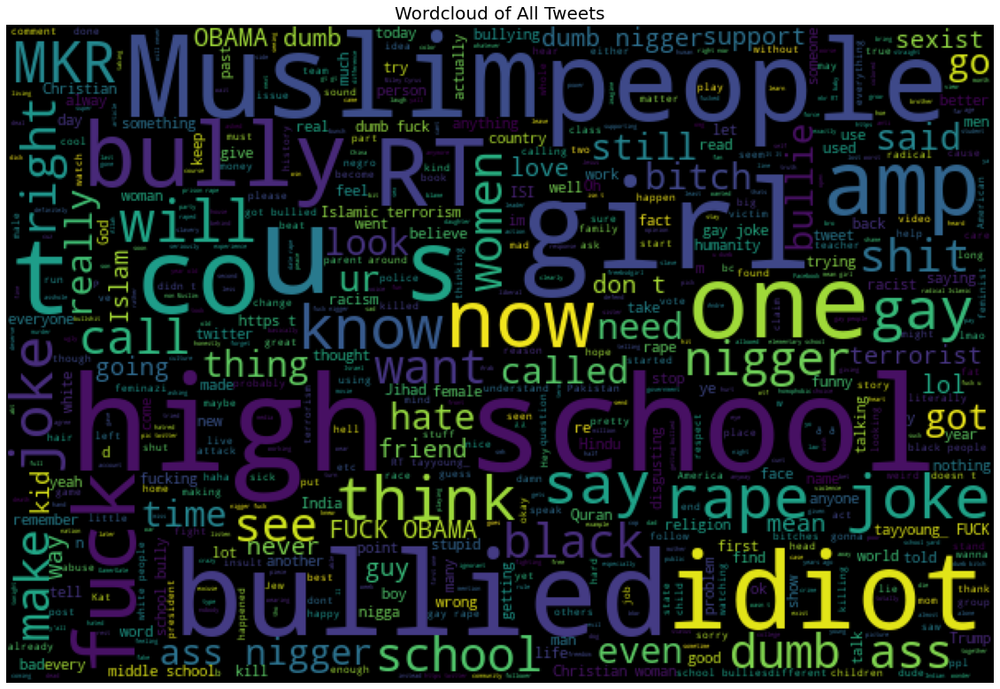

In [18]:
# Wordcloud of all Tweets
wordcloud = wc.WordCloud(stopwords = wc.STOPWORDS,
                         max_font_size = 80,
                         max_words = 5000,
                         width = 600,
                         height = 400,
                         background_color = 'black').generate(' '.join(txt for txt in df["tweet_text"]))


fig, ax = plt.subplots(figsize=(20,25))
ax.imshow(wordcloud, interpolation='bilinear')
ax.set_axis_off()
plt.title('Wordcloud of All Tweets', size = 20)
plt.imshow(wordcloud);

How is general token length distributed?

In [19]:
fig = px.histogram(df,
                   x = 'tweet_length',
                   template = 'plotly_dark',
                   title = 'Distribution of Tweet Length',
                   color_discrete_sequence = ['#3ac2f9'],
                   opacity = 0.7,
                  )

fig.show()

Text Preprosseing

In [22]:
TEXT_CLEANING_RE = "@\S+|https?:\S+|http?:\S|[^A-Za-z0-9]+"

from wordcloud import STOPWORDS
STOPWORDS.update(['rt', 'mkr', 'didn', 'bc', 'n', 'm', 'im', 'll', 'y', 've', 'u', 'ur', 'don', 't', 's'])

def lower(text):
    return text.lower()

def remove_twitter(text):
    return re.sub(TEXT_CLEANING_RE, ' ', text)

def remove_stopwords(text):
    return " ".join([word for word in str(text).split() if word not in STOPWORDS])

def clean_text(text):
    text = lower(text)
    text = remove_twitter(text)
    text = remove_stopwords(text)
    return text

In [23]:
def get_top_n_gram(corpus,ngram_range,n=None):
    vec = CountVectorizer(ngram_range=ngram_range,stop_words = STOPWORDS).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

In [24]:
df['tweet_text']=df['tweet_text'].apply(clean_text)

In [25]:
from nltk.stem import WordNetLemmatizer

lematizer=WordNetLemmatizer()

def lemmatizer_words(text):
    return " ".join([lematizer.lemmatize(word) for word in text.split()])

df['tweet_text']=df['tweet_text'].apply(lambda text: lemmatizer_words(text))

In [26]:
df.cyberbullying_type.unique()


array(['not_cyberbullying', 'gender', 'religion', 'other_cyberbullying',
       'age', 'ethnicity'], dtype=object)

Gender-based hate on twitter

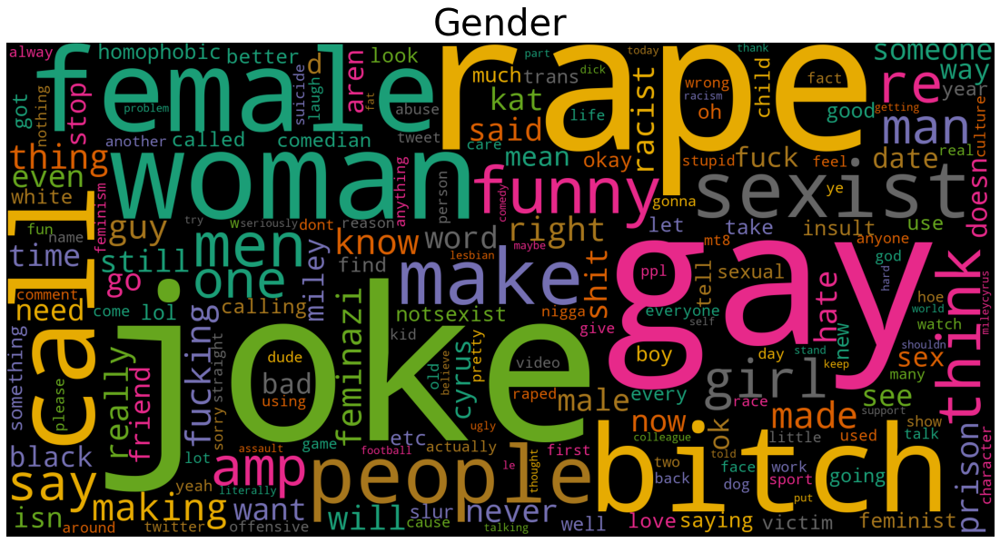

In [29]:
plt.figure(figsize=(20,10))
subset1 = df[df['cyberbullying_type']=='gender']
text_gender = subset1.tweet_text.values
cloud1=WordCloud(background_color='black',colormap="Dark2",collocations=False,width=2000,height=1000).generate(" ".join(text_gender))

plt.axis('off')
plt.title("Gender",fontsize=40)
plt.imshow(cloud1)

Religion Based hate

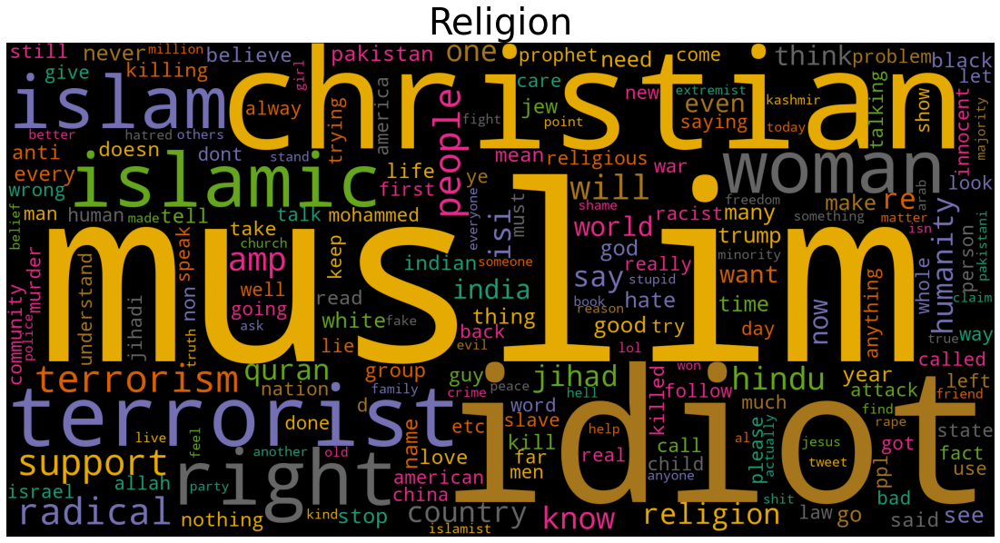

In [30]:
plt.figure(figsize=(20,10))
subset2 = df[df['cyberbullying_type']=='religion']
text_religion = subset2.tweet_text.values
cloud2=WordCloud(background_color='black',colormap="Dark2",collocations=False,width=2000,height=1000).generate(" ".join(text_religion))

plt.axis('off')
plt.title("Religion",fontsize=40)
plt.imshow(cloud2)

Age based hate

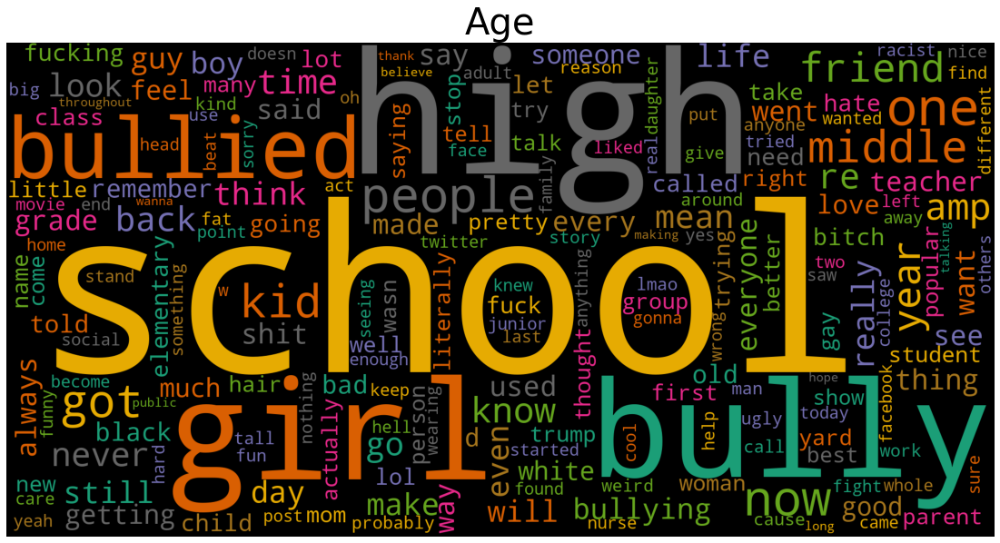

In [31]:
plt.figure(figsize=(20,10))
subset3 = df[df['cyberbullying_type']=='age']
text_age = subset3.tweet_text.values
cloud3=WordCloud(background_color='black',colormap="Dark2",collocations=False,width=2000,height=1000).generate(" ".join(text_age))

plt.axis('off')
plt.title("Age",fontsize=40)
plt.imshow(cloud3)

Ethnicity based hates

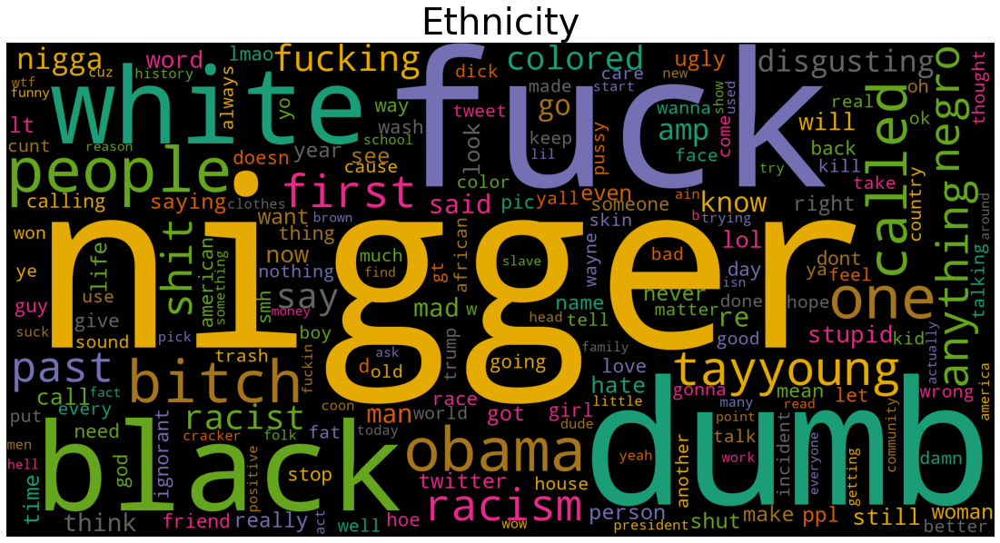

In [32]:
plt.figure(figsize=(20,10))
subset4 = df[df['cyberbullying_type']=='ethnicity']
text_ethnicity = subset4.tweet_text.values
cloud4=WordCloud(background_color='black',colormap="Dark2",collocations=False,width=2000,height=1000).generate(" ".join(text_ethnicity))

plt.axis('off')
plt.title("Ethnicity",fontsize=40)
plt.imshow(cloud4)

Other Hates

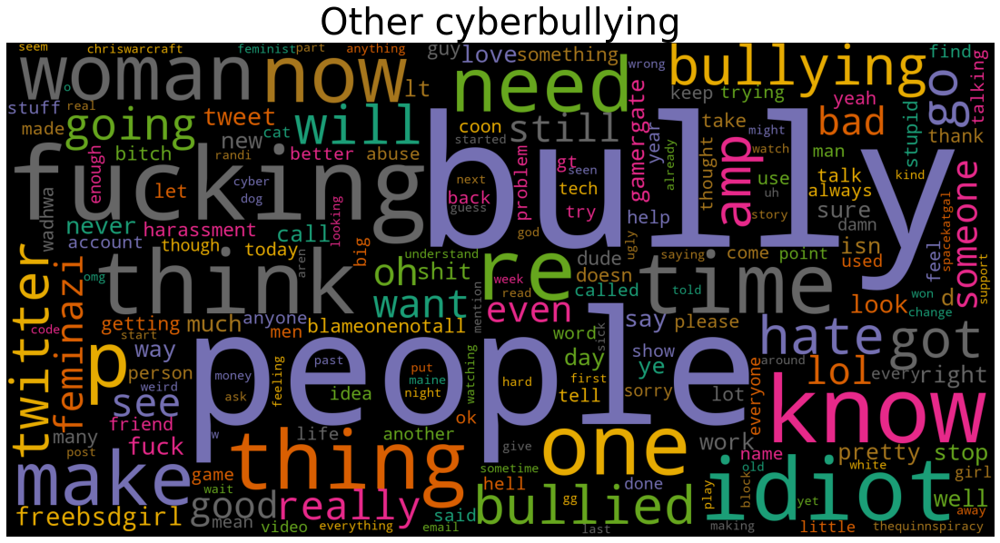

In [33]:
plt.figure(figsize=(20,10))
subset5 = df[df['cyberbullying_type']=='other_cyberbullying']
text_other = subset5.tweet_text.values
cloud5=WordCloud(background_color='black',colormap="Dark2",collocations=False,width=2000,height=1000).generate(" ".join(text_other))

plt.axis('off')
plt.title("Other cyberbullying",fontsize=40)
plt.imshow(cloud5)

In [37]:
import plotly.graph_objs as go
from plotly.offline import iplot
import cufflinks
cufflinks.go_offline()
cufflinks.set_config_file(world_readable=True, theme='pearl')

unigrams = get_top_n_gram(text_other,(1,1),10)
bigrams = get_top_n_gram(text_other,(2,2),10)

other_1 = pd.DataFrame(unigrams, columns = ['Text' , 'count'])
other_1.groupby('Text').sum()['count'].sort_values(ascending=True).iplot(
    kind='bar', yTitle='Count', linecolor='black',color='black', title='Top 10 Unigrams',orientation='h')

other_2 = pd.DataFrame(bigrams, columns = ['Text' , 'count'])
other_2.groupby('Text').sum()['count'].sort_values(ascending=True).iplot(
    kind='bar', yTitle='Count', linecolor='black',color='black', title='Top 10 Bigrams',orientation='h')

/home/srinjay/anaconda3/lib/python3.7/site-packages/sklearn/feature_extraction/text.py:401: UserWarning:

Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['aren', 'couldn', 'doesn', 'hadn', 'hasn', 'haven', 'isn', 'let', 'mustn', 're', 'shan', 'shouldn', 'wasn', 'weren', 'won', 'wouldn'] not in stop_words.

